<a href="https://colab.research.google.com/github/chhendley/Chhendley-portfolio-python/blob/main/lane_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Assignment from Machine learning and Deep Learning Bootcamp in Python cours by Holczer Balazs
 

In [1]:
from google.colab import files
uploaded = files.upload()

Saving lane_detection_video.mp4 to lane_detection_video.mp4


In [1]:
import cv2
import numpy as np

from google.colab.patches import cv2_imshow

In [2]:
def draw_the_lines(image, lines):
  lines_image = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)

  for line in lines:
    for x1, y1, x2, y2 in line:
      cv2.line(lines_image, (x1, y1), (x2, y2), (0,0,255), thickness = 3)

  image_with_lines = cv2.addWeighted(image, 0.8, lines_image, 1, 0.0)

  return image_with_lines


def region_of_interest(image, region_points):
  mask = np.zeros_like(image)
  cv2.fillPoly(mask, region_points, 255)
  masked_image = cv2.bitwise_and(image, mask)
  return masked_image


def get_detected_lanes(image):
  (height, width) = (image.shape[0], image.shape[1])

  gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  canny_image = cv2.Canny(gray_image, 100, 120)
  region_of_interest_vertices = [
    (0, height),
    (width/2, height*0.65),
    (width, height)]
  cropped_image = region_of_interest(canny_image, np.array([region_of_interest_vertices], np.int32))

  lines = cv2.HoughLinesP(cropped_image, rho=2, theta = np.pi/180, threshold = 50, lines = np.array([]), 
                       minLineLength=40, maxLineGap= 150)
  image_with_lines = draw_the_lines(image, lines)
  return image_with_lines




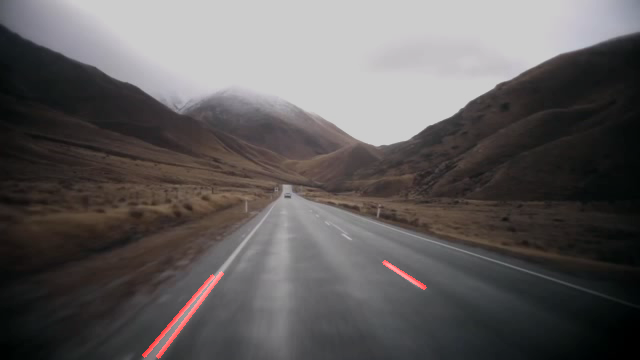

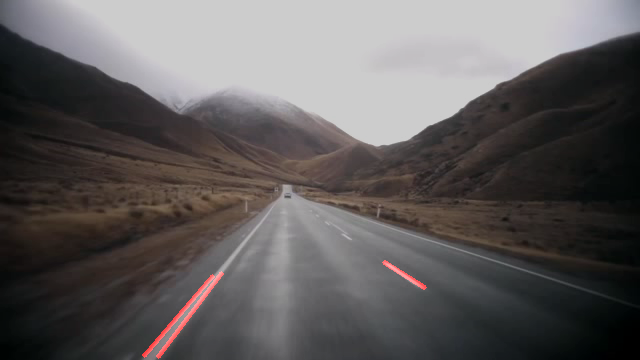

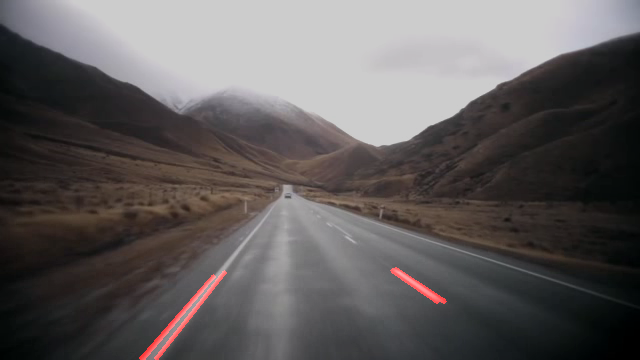

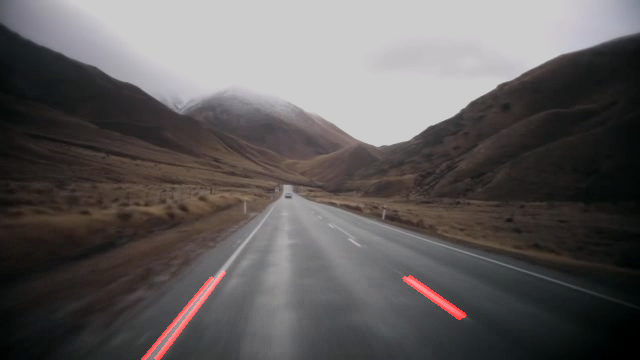

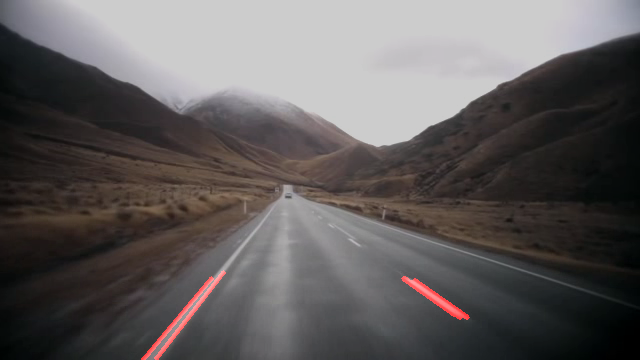

...

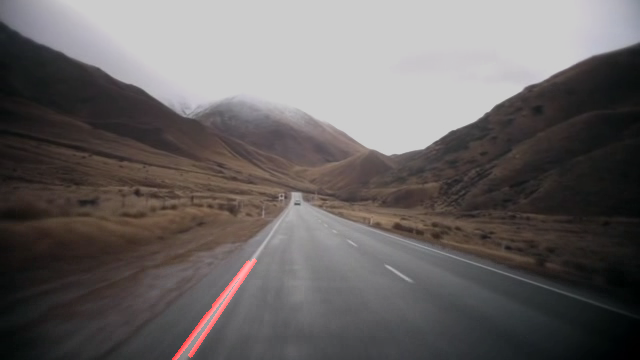

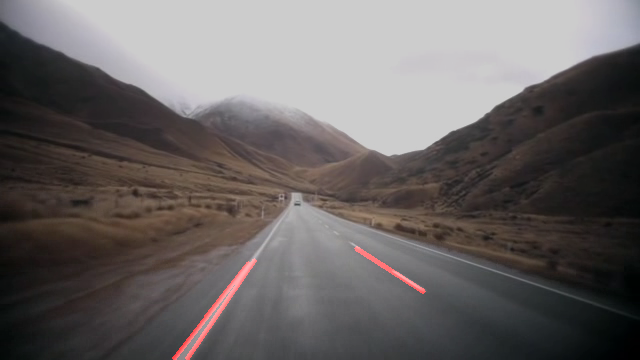

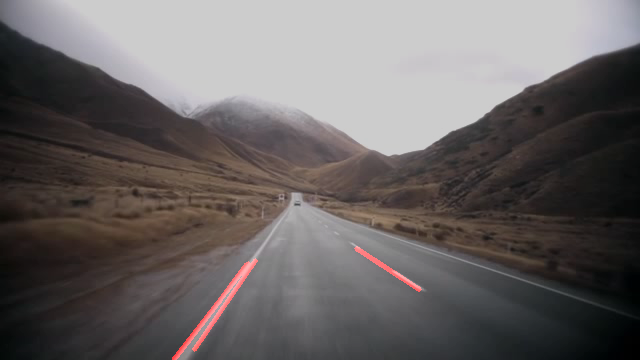

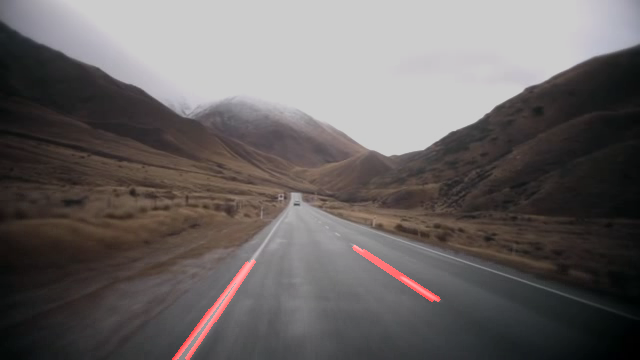

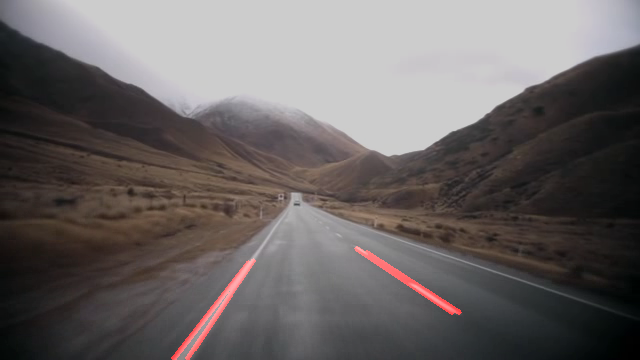

KeyboardInterrupt: ignored

In [3]:
# video = several frames (images shown after each other)
video = cv2.VideoCapture('lane_detection_video.mp4')

while video.isOpened():

    is_grabbed, frame = video.read()

    # because the end of the video
    if not is_grabbed:
        break

    frame = get_detected_lanes(frame)

    cv2_imshow(frame)
    cv2.waitKey(1)

video.release()
cv2.destroyAllWindows()